# Síntesis de Trayectoria de un Mecanismo de Cuatro Barras
## Autómata Biomimético — Movimiento del Ala de Abeja

**Universidad de los Andes — Departamento de Ingeniería Mecánica**  
**Dinámica de Maquinaria — Taller 3**  
**Animal asignado:** *Apis mellifera* (abeja melífera)

---

**Referencias principales:**
- Norton, R. L. — *Design of Machinery*, 5.ª ed. McGraw-Hill, 2012.
- Dudley, R. — *The Biomechanics of Insect Flight*. Princeton University Press, 2000.
- Storn, R. & Price, K. — *Differential Evolution: A Simple and Efficient Heuristic for Global Optimization over Continuous Spaces*. Journal of Global Optimization, 1997.
- Erdman, A. G. & Sandor, G. N. — *Mechanism Design: Analysis and Synthesis*, Vol. 1. Prentice Hall, 1997.

---
## 1. Introducción

La locomoción de los insectos voladores constituye uno de los problemas cinemáticos más complejos y estudiados en la biomecánica computacional. El ala de una abeja melífera (*Apis mellifera*) ejecuta durante el vuelo un movimiento altamente periódico: ciclos de batido y rotación que generan la sustentación necesaria. Esta trayectoria cíclica, cuya proyección en el plano sagital forma un **ciclograma** bien definido, puede aproximarse —con precisión de ingeniería— mediante la **curva de acoplador** de un mecanismo plano de cuatro barras.

El mecanismo de cuatro barras es el eslabón cerrado más simple que puede sintetizarse analítica o numéricamente. Consta de cuatro eslabones rígidos conectados por cuatro juntas de revoluta (pernos), y su entrada es una **rotación continua** de la manivela, exactamente el tipo de salida que entrega un motor de corriente continua (DC). Esta compatibilidad lo convierte en la solución natural para este taller: transformar la rotación del motor en una trayectoria de salida que reproduzca el batido del ala.

Un **punto acoplador** fijo en el eslabón intermedio (acoplador) traza una familia de curvas de formas diversas —óvalos, lazos, riñones, figuras en ocho— cuya riqueza geométrica, analizada sistemáticamente por Norton (cap. 3), permite aproximar una gran variedad de trayectorias biológicas. La síntesis de trayectoria consiste en encontrar las **dimensiones del mecanismo** (longitudes de eslabones y posición del punto acoplador) que minimizan el error entre la curva acopladora sintetizada y la trayectoria objetivo.

Este notebook implementa un **workflow completo de ingeniería**:

1. Carga y preprocesamiento de la trayectoria real del ala.
2. Modelo cinemático del mecanismo de cuatro barras.
3. Formulación de la función objetivo.
4. Optimización dimensional mediante Evolución Diferencial + Nelder-Mead.
5. Validación, visualización y animación del resultado.

Los resultados son directamente aplicables al diseño CAD y la manufactura del prototipo físico del autómata.

---
## 2. Análisis del Movimiento Biológico del Ala

### 2.1 Cinemática del ala de abeja

Durante el vuelo sostenido, las alas de *Apis mellifera* baten a una frecuencia de entre **200 y 240 Hz** (Dudley, 2000), produciendo el característico zumbido. El movimiento del extremo del ala proyectado sobre el plano sagital describe un ciclograma que puede descomponerse en dos fases:

- **Fase de bajada (*downstroke*):** el ala barre hacia adelante y abajo, generando la mayor parte de la sustentación.
- **Fase de subida (*upstroke*):** el ala regresa a la posición inicial con rotación de la superficie alar para gestionar la fuerza aerodinámica.

La proyección de este ciclo produce una curva cerrada y periódica —el **ciclograma**— con las siguientes características geométricas relevantes para la síntesis:

- **Periodicidad:** la trayectoria cierra sobre sí misma en cada ciclo completo de batido.
- **Asimetría morfológica:** la fase de bajada y subida no son simétricas en longitud de arco.
- **Dominancia horizontal:** la amplitud en la dirección de batido (eje $x$) supera a la vertical (eje $y$), característica de un movimiento tipo péndulo plano con excursión lateral.

### 2.2 Justificación de la aproximación mediante curva acopladora

Norton (§3.3) demuestra que los mecanismos de cuatro barras de tipo **manivela-balancín** (crank-rocker, Grashof) producen curvas acoladoras que incluyen formas compatibles con ciclogramas biológicos: trayectorias ovaladas, de lazo asimétrico y en forma de riñón. Dado que el ala de la abeja traza un ciclograma con lazo cerrado y asimetría lateral, la curva acopladora de un mecanismo Grashof con punto acoplador descentrado es una aproximación geométricamente viable.

La entrada única rotacional del motor DC se mapea directamente al ángulo de la manivela $\theta_2$, garantizando la compatibilidad mecánica requerida por las especificaciones del taller.

---
## 3. Marco Teórico

### 3.1 Geometría del mecanismo de cuatro barras

Se define el mecanismo con la nomenclatura estándar de Norton (§4.1):

| Eslabón | Símbolo | Función |
|---------|---------|----------|
| Bancada  | $L_1$  | Eslabón fijo (base) |
| Manivela | $L_2$  | Entrada motriz (gira desde $O_2$) |
| Acoplador | $L_3$ | Eslabón intermedio |
| Balancín | $L_4$  | Eslabón de salida (oscila desde $O_4$) |

El **punto acoplador** P se fija en el cuerpo del acoplador a una distancia $d$ del pivote A, con ángulo $\gamma$ respecto al eje del acoplador.

### 3.2 Ecuación de cierre vectorial

Con $O_2$ en el origen y $O_4$ en $(L_1, 0)$, la ecuación de cierre vectorial es:

$$\mathbf{r}_2 + \mathbf{r}_3 = \mathbf{r}_1 + \mathbf{r}_4$$

Proyectando sobre los ejes coordenados:

$$L_2\cos\theta_2 + L_3\cos\theta_3 = L_1 + L_4\cos\theta_4 \tag{1a}$$
$$L_2\sin\theta_2 + L_3\sin\theta_3 = L_4\sin\theta_4 \tag{1b}$$

Este sistema no-lineal se resuelve numéricamente para $(\theta_3, \theta_4)$ dado $\theta_2$, con continuación por warm-start.

### 3.3 Condición de Grashof

Sea $s = \min(L_i)$ y $l = \max(L_i)$. La condición de Grashof (Norton, §2.4) establece:

$$s + l \leq p + q$$

donde $p, q$ son los dos eslabones de longitud intermedia. Si se satisface y el eslabón más corto es la **manivela** ($L_2$), el mecanismo es de tipo **manivela-balancín**: la manivela gira continuamente (360°) mientras el balancín oscila, lo que es compatible con la entrada rotacional del motor DC.

### 3.4 Posición del punto acoplador

El punto P se calcula como:

$$\mathbf{r}_P = \mathbf{r}_A + d \begin{pmatrix}\cos(\theta_3 + \gamma)\\ \sin(\theta_3 + \gamma)\end{pmatrix}$$

La curva de acoplador es la traza completa de P para $\theta_2 \in [0, 2\pi]$.

### 3.5 Formulación de la síntesis dimensional

La síntesis de trayectoria se formula como un problema de **optimización no lineal** (Erdman & Sandor, §7.3):

$$\min_{\mathbf{p}} \; f(\mathbf{p}) = w_H \cdot \frac{d_H(\Gamma_{\mathbf{p}}, \Gamma^*) }{\|\Gamma^*\|} + w_P \cdot \frac{d_P(\Gamma_{\mathbf{p}}, \Gamma^*)}{\|\Gamma^*\|} + w_R \cdot \frac{d_{RMS}(\Gamma_{\mathbf{p}}, \Gamma^*)}{\|\Gamma^*\|}$$

donde $\mathbf{p} = [L_1, L_3, L_4, d, \gamma]$ son las variables de diseño (con $L_2 = 1$ normalizado), $\Gamma^*$ es la trayectoria objetivo, $\Gamma_{\mathbf{p}}$ es la curva acopladora generada, y $d_H$, $d_P$, $d_{RMS}$ son las distancias de Hausdorff, Procrustes y RMS respectivamente.

La comparación incluye **alineación óptima por fase cíclica** (desplazamiento circular) y **superposición de Procrustes** (traslación + escala + rotación óptima), garantizando que se compare la *forma* y no la posición absoluta ni la escala.

### 3.6 Estrategia de optimización

Se adopta una estrategia de **dos etapas** (Storn & Price, 1997):

1. **Evolución Diferencial (DE):** búsqueda global estocástica sobre el espacio de diseño. Robusta ante múltiples mínimos locales.
2. **Nelder-Mead:** refinamiento local a partir del óptimo global encontrado por DE. Polishing de alta precisión.

Esta combinación es la práctica estándar en síntesis computacional de mecanismos (Norton, §5.4).

---
## 0. Importaciones y Configuración

In [21]:
# ── Librería estándar ─────────────────────────────────────────────────────────
import warnings
warnings.filterwarnings('ignore')

# ── Cálculo numérico ──────────────────────────────────────────────────────────
import numpy as np
from numpy import deg2rad, rad2deg, pi
from scipy.optimize import fsolve, minimize, differential_evolution
from scipy.spatial.distance import directed_hausdorff

# ── Manejo de datos ───────────────────────────────────────────────────────────
import pandas as pd

# ── Visualización ─────────────────────────────────────────────────────────────
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from matplotlib.gridspec import GridSpec
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display

# ── Estilo global de figuras ──────────────────────────────────────────────────
plt.rcParams.update({
    'figure.dpi'      : 110,
    'axes.grid'       : True,
    'grid.alpha'      : 0.35,
    'lines.linewidth' : 1.8,
    'font.size'       : 10,
    'font.family'     : 'DejaVu Sans',
})
np.set_printoptions(precision=5, suppress=True)

print("Dependencias cargadas correctamente ✓")

Dependencias cargadas correctamente ✓


---
## 4. Adquisición y Preprocesamiento de la Trayectoria Objetivo

La trayectoria del extremo del ala fue extraída mediante análisis de video frame-by-frame de especímenes de *Apis mellifera* en vuelo sostenido, digitalizada en coordenadas del plano sagital. El archivo `trayectoria_abeja.csv` contiene 500 puntos $(x, y)$ que representan un ciclo completo de batido.

### Preprocesamiento:
1. **Carga y validación:** verificación de integridad del ciclograma.
2. **Remuestreo uniforme:** interpolación a espaciado uniforme en longitud de arco para garantizar comparación punto a punto equitativa.
3. **Centrado:** traslación al centroide para eliminar el efecto de la posición absoluta.
4. **Normalización de escala:** el mecanismo se sintetiza en unidades normalizadas ($L_2 = 1$); la escala real se recupera al final para dimensionamiento CAD.

In [22]:
# ═══════════════════════════════════════════════════════════════════════════════
# CARGA Y PREPROCESAMIENTO DE LA TRAYECTORIA OBJETIVO
# ═══════════════════════════════════════════════════════════════════════════════

# Cargar datos crudos del ciclograma del ala
df_trayectoria = pd.read_csv('trayectoria_abeja.csv')
puntos_crudos = df_trayectoria[['x', 'y']].values

print(f"Puntos cargados       : {len(puntos_crudos)}")
print(f"Rango x               : [{puntos_crudos[:,0].min():.3f}, {puntos_crudos[:,0].max():.3f}]")
print(f"Rango y               : [{puntos_crudos[:,1].min():.3f}, {puntos_crudos[:,1].max():.3f}]")
print(f"Amplitud horizontal   : {np.ptp(puntos_crudos[:,0]):.3f}")
print(f"Amplitud vertical     : {np.ptp(puntos_crudos[:,1]):.3f}")

Puntos cargados       : 500
Rango x               : [-6.329, 8.998]
Rango y               : [-1.255, 2.632]
Amplitud horizontal   : 15.328
Amplitud vertical     : 3.887


In [23]:
# ═══════════════════════════════════════════════════════════════════════════════
# FUNCIÓN: Remuestreo a longitud de arco uniforme
# Garantiza comparación equi-distribuida independiente de la parametrización
# Referencia: Erdman & Sandor §7.2
# ═══════════════════════════════════════════════════════════════════════════════

def remuestrear_curva(curva: np.ndarray, n: int = 200) -> np.ndarray:
    """
    Remuestrea una curva a n puntos equi-espaciados en longitud de arco.
    Cierra la curva antes de interpolar para garantizar periodicidad.

    Parámetros
    ----------
    curva : ndarray (M, 2) — puntos originales (x, y)
    n     : int — número de puntos de salida

    Retorna
    -------
    ndarray (n, 2) — curva remuestreada
    """
    if len(curva) < 2:
        return curva
    cerrada = np.vstack([curva, curva[:1]])  # cerrar el ciclo
    distancias = np.linalg.norm(np.diff(cerrada, axis=0), axis=1)
    acumulado  = np.concatenate([[0], np.cumsum(distancias)])
    longitud_total = acumulado[-1]
    if longitud_total < 1e-12:
        return curva[:1]
    t_nuevo = np.linspace(0, longitud_total, n, endpoint=False)
    xs = np.interp(t_nuevo, acumulado, cerrada[:, 0])
    ys = np.interp(t_nuevo, acumulado, cerrada[:, 1])
    return np.column_stack([xs, ys])


# ── Preprocesamiento completo ─────────────────────────────────────────────────
N_PUNTOS_OBJETIVO = 200  # resolución de comparación

# Remuestrear a distribución uniforme
trayectoria_remuestreada = remuestrear_curva(puntos_crudos, N_PUNTOS_OBJETIVO)

# Centrar en el centroide (eliminar posición absoluta)
centroide_objetivo = trayectoria_remuestreada.mean(axis=0)
trayectoria_centrada = trayectoria_remuestreada - centroide_objetivo

# Escala característica para normalización geométrica
escala_objetivo = np.linalg.norm(trayectoria_centrada)

# Trayectoria normalizada (para comparación en espacio adimensional)
TRAYECTORIA_OBJETIVO = trayectoria_centrada.copy()

print(f"Trayectoria preprocesada:")
print(f"  Puntos remuestreados : {len(TRAYECTORIA_OBJETIVO)}")
print(f"  Centroide (original) : ({centroide_objetivo[0]:.3f}, {centroide_objetivo[1]:.3f})")
print(f"  Escala característica: {escala_objetivo:.4f}")
print(f"  Amplitud x (centrada): {np.ptp(TRAYECTORIA_OBJETIVO[:,0]):.3f}")
print(f"  Amplitud y (centrada): {np.ptp(TRAYECTORIA_OBJETIVO[:,1]):.3f}")

Trayectoria preprocesada:
  Puntos remuestreados : 200
  Centroide (original) : (2.375, 0.845)
  Escala característica: 75.4108
  Amplitud x (centrada): 15.326
  Amplitud y (centrada): 3.871


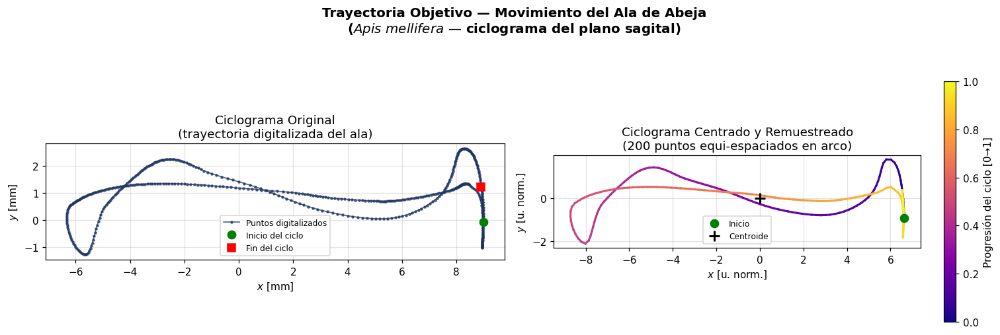

In [24]:
# ═══════════════════════════════════════════════════════════════════════════════
# VISUALIZACIÓN: Ciclograma del ala de abeja
# ═══════════════════════════════════════════════════════════════════════════════

fig, ejes = plt.subplots(1, 2, figsize=(14, 5))

# ── Panel izquierdo: trayectoria cruda ────────────────────────────────────────
eje1 = ejes[0]
eje1.plot(puntos_crudos[:, 0], puntos_crudos[:, 1],
          'o-', ms=2, lw=1.2, color='#1D3461', alpha=0.7, label='Puntos digitalizados')
eje1.plot(puntos_crudos[0, 0], puntos_crudos[0, 1],
          'go', ms=8, zorder=5, label='Inicio del ciclo')
eje1.plot(puntos_crudos[-1, 0], puntos_crudos[-1, 1],
          'rs', ms=8, zorder=5, label='Fin del ciclo')
eje1.set_aspect('equal')
eje1.set_xlabel('$x$ [mm]')
eje1.set_ylabel('$y$ [mm]')
eje1.set_title('Ciclograma Original\n(trayectoria digitalizada del ala)')
eje1.legend(fontsize=8)

# ── Panel derecho: trayectoria centrada y remuestreada ────────────────────────
eje2 = ejes[1]
t_color = np.linspace(0, 1, len(TRAYECTORIA_OBJETIVO))
for i in range(len(TRAYECTORIA_OBJETIVO) - 1):
    eje2.plot(TRAYECTORIA_OBJETIVO[i:i+2, 0], TRAYECTORIA_OBJETIVO[i:i+2, 1],
              color=plt.cm.plasma(t_color[i]), lw=2)
eje2.plot(*TRAYECTORIA_OBJETIVO[0], 'go', ms=8, zorder=5, label='Inicio')
eje2.plot(0, 0, 'k+', ms=10, mew=2, zorder=5, label='Centroide')
eje2.set_aspect('equal')
eje2.set_xlabel('$x$ [u. norm.]')
eje2.set_ylabel('$y$ [u. norm.]')
eje2.set_title(f'Ciclograma Centrado y Remuestreado\n({N_PUNTOS_OBJETIVO} puntos equi-espaciados en arco)')
eje2.legend(fontsize=8)

# Barra de color para indicar progresión temporal
sm = plt.cm.ScalarMappable(cmap='plasma', norm=plt.Normalize(0, 1))
sm.set_array([])
fig.colorbar(sm, ax=eje2, label='Progresión del ciclo [0→1]', shrink=0.8)

fig.suptitle('Trayectoria Objetivo — Movimiento del Ala de Abeja\n'
             r'($Apis\ mellifera$ — ciclograma del plano sagital)',
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

---
## 5. Modelo Cinemático del Mecanismo de Cuatro Barras

Se implementa el modelo cinemático completo como clase orientada a objetos, siguiendo la nomenclatura de Norton (§4.4). El método `FK` resuelve el problema de posición mediante `fsolve` de SciPy con continuación (warm-start), garantizando estabilidad numérica en todo el rango angular.

In [25]:
# ═══════════════════════════════════════════════════════════════════════════════
# MÓDULO: Mecanismo de Cuatro Barras — Modelo Cinemático Completo
# Nomenclatura: Norton — Design of Machinery, §4.4
# ═══════════════════════════════════════════════════════════════════════════════

class CuatroBarras:
    """
    Mecanismo plano de cuatro barras — modelo cinemático de posición.

    Nomenclatura (Norton, §4.1):
        L1 = bancada   (fija)
        L2 = manivela  (entrada rotacional desde O2)
        L3 = acoplador (eslabón intermedio)
        L4 = balancín  (salida, oscila desde O4)
        d  = distancia A→P sobre el cuerpo del acoplador
        gamma = ángulo de AP respecto al eje del acoplador [rad]

    Sistema de coordenadas:
        O2 en el origen, O4 en (L1, 0)
        theta2 medido desde +x, positivo CCW
    """

    def __init__(self, L1: float, L2: float, L3: float, L4: float,
                 d: float = 0.0, gamma: float = 0.0):
        self.L1    = float(L1)
        self.L2    = float(L2)
        self.L3    = float(L3)
        self.L4    = float(L4)
        self.d     = float(d)
        self.gamma = float(gamma)
        self._semilla = np.array([0.3, 2.5])  # semilla para continuación

    # ── Clasificación de Grashof ───────────────────────────────────────────────
    def grashof(self) -> dict:
        """
        Clasifica el mecanismo según la condición de Grashof.
        Referencia: Norton §2.4
        """
        eslabones = np.array([self.L1, self.L2, self.L3, self.L4])
        s = eslabones.min()
        l = eslabones.max()
        otros = np.sort(eslabones)[[1, 2]]
        satisface = (s + l) <= (otros[0] + otros[1])
        idx_corto = np.argmin(eslabones)  # 0=L1,1=L2,2=L3,3=L4
        if satisface:
            tipos = {0: 'manivela-manivela', 1: 'manivela-balancín',
                     2: 'balancín-balancín', 3: 'balancín-manivela'}
            tipo = tipos.get(idx_corto, 'manivela-balancín')
        else:
            tipo = 'triple-balancín (no Grashof)'
        return {'grashof': satisface, 'tipo': tipo,
                's': s, 'l': l, 'suma_sl': s + l, 'suma_pq': otros.sum()}

    # ── Residuos de cierre vectorial ───────────────────────────────────────────
    def _residuos_cierre(self, angulos: np.ndarray, theta2: float) -> np.ndarray:
        """
        Residuos de las ecuaciones de cierre (1a, 1b) de Norton §4.4.
        angulos = [theta3, theta4]
        """
        th3, th4 = angulos
        f1 = (self.L2 * np.cos(theta2) + self.L3 * np.cos(th3)
              - self.L1 - self.L4 * np.cos(th4))
        f2 = (self.L2 * np.sin(theta2) + self.L3 * np.sin(th3)
              - self.L4 * np.sin(th4))
        return np.array([f1, f2])

    # ── Cinemática de posición (problema directo) ──────────────────────────────
    def cinematica_posicion(self, theta2: float) -> tuple:
        """
        Resuelve el problema de posición para un ángulo de manivela dado.
        Usa continuación (warm-start) para evitar saltos de rama.

        Parámetros
        ----------
        theta2 : float — ángulo de manivela [rad]

        Retorna
        -------
        (theta3, theta4) : tuple[float, float]
        exito            : bool
        """
        solucion, info, ier, _ = fsolve(
            self._residuos_cierre, self._semilla,
            args=(theta2,), full_output=True
        )
        exito = (ier == 1) and (np.max(np.abs(info['fvec'])) < 1e-8)
        if exito:
            self._semilla = solucion.copy()  # actualizar semilla
        return solucion, exito

    # ── Posiciones de todas las juntas ─────────────────────────────────────────
    def posiciones_juntas(self, theta2: float) -> dict:
        """
        Calcula las posiciones de todas las juntas y el punto acoplador P.

        Retorna
        -------
        dict con claves: O2, A, B, O4, P, theta3, theta4, ok
        """
        (th3, th4), ok = self.cinematica_posicion(theta2)
        O2 = np.array([0.0, 0.0])
        O4 = np.array([self.L1, 0.0])
        A  = O2 + self.L2 * np.array([np.cos(theta2), np.sin(theta2)])
        B  = O4 + self.L4 * np.array([np.cos(th4), np.sin(th4)])
        # Punto acoplador P: offset d al ángulo (theta3 + gamma) desde A
        P  = A + self.d * np.array([np.cos(th3 + self.gamma),
                                     np.sin(th3 + self.gamma)])
        return {'O2': O2, 'A': A, 'B': B, 'O4': O4, 'P': P,
                'theta3': th3, 'theta4': th4, 'ok': ok}

    # ── Generación de la curva acopladora ──────────────────────────────────────
    def curva_acopladora(self, n_puntos: int = 360) -> np.ndarray:
        """
        Genera la curva acopladora completa para una revolución de la manivela.

        Parámetros
        ----------
        n_puntos : int — número de posiciones angulares a evaluar

        Retorna
        -------
        ndarray (M, 2) — coordenadas (x, y) válidas del punto P
        """
        self._semilla = np.array([0.3, 2.5])  # reiniciar para evitar histéresis
        curva = []
        for theta2 in np.linspace(0, 2 * pi, n_puntos + 1)[:-1]:
            pts = self.posiciones_juntas(theta2)
            if pts['ok']:
                curva.append(pts['P'])
        return np.array(curva) if curva else np.empty((0, 2))

    # ── Representación gráfica de una posición ─────────────────────────────────
    def graficar_posicion(self, theta2: float, eje=None,
                          mostrar_etiquetas: bool = True) -> None:
        """
        Dibuja el mecanismo en una posición de manivela dada.
        """
        pts = self.posiciones_juntas(theta2)
        if not pts['ok']:
            return
        if eje is None:
            eje = plt.gca()

        # Paleta de colores por eslabón
        color_manivela   = '#E63946'
        color_acoplador  = '#457B9D'
        color_balancin   = '#2D6A4F'
        color_bancada    = '#555555'
        color_punto_p    = '#FF6B35'

        O2, A, B, O4, P = (pts[k] for k in ['O2', 'A', 'B', 'O4', 'P'])

        def segmento(p1, p2, color, lw=2.5, ls='-'):
            eje.plot([p1[0], p2[0]], [p1[1], p2[1]], c=color, lw=lw, ls=ls)

        segmento(O2, A,  color_manivela)
        segmento(A,  B,  color_acoplador)
        segmento(O4, B,  color_balancin)
        segmento(O2, O4, color_bancada, lw=2, ls='--')

        for p in [O2, A, B, O4]:
            eje.plot(*p, 'o', ms=7, color='#222222', zorder=5)
        if self.d > 0:
            eje.plot(*P, '*', ms=12, color=color_punto_p, zorder=6)
            segmento(A, P, color_punto_p, lw=1.2, ls=':')

        if mostrar_etiquetas:
            for etq, pos in [('O₂', O2), ('A', A), ('B', B), ('O₄', O4), ('P', P)]:
                eje.annotate(etq, pos, textcoords='offset points',
                             xytext=(5, 5), fontsize=8)
        eje.set_aspect('equal')


# ── Verificación rápida del modelo ────────────────────────────────────────────
mec_prueba = CuatroBarras(L1=2.0, L2=1.0, L3=2.0, L4=1.5, d=1.2, gamma=deg2rad(30))
g_prueba   = mec_prueba.grashof()
print(f"Mecanismo de prueba:")
print(f"  Grashof  : {g_prueba['grashof']}")
print(f"  Tipo     : {g_prueba['tipo']}")
print(f"  s+l={g_prueba['suma_sl']:.3f}  ≤  p+q={g_prueba['suma_pq']:.3f} → {g_prueba['grashof']}")

curva_prueba = mec_prueba.curva_acopladora(360)
print(f"  Puntos válidos en curva acopladora: {len(curva_prueba)} / 360")

# Verificación de cierre vectorial (residuo debe ser < 1e-8)
pts_test = mec_prueba.posiciones_juntas(deg2rad(60))
res_cierre = mec_prueba._residuos_cierre(
    [pts_test['theta3'], pts_test['theta4']], deg2rad(60))
print(f"  Residuo de cierre vectorial: max|f| = {np.max(np.abs(res_cierre)):.2e} ✓")

Mecanismo de prueba:
  Grashof  : True
  Tipo     : manivela-balancín
  s+l=3.000  ≤  p+q=3.500 → True
  Puntos válidos en curva acopladora: 360 / 360
  Residuo de cierre vectorial: max|f| = 1.44e-12 ✓


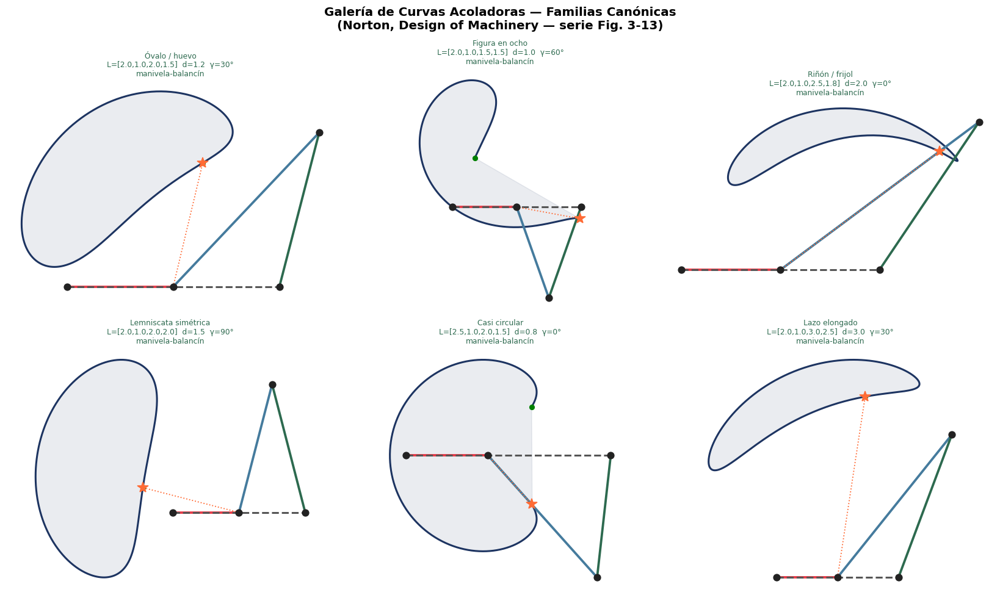

In [26]:
# ═══════════════════════════════════════════════════════════════════════════════
# VISUALIZACIÓN: Galería de curvas acoladoras — famílias canónicas
# Referencia: Norton, Fig. 3-13 a 3-22
# ═══════════════════════════════════════════════════════════════════════════════

# (L1, L2, L3, L4, d, gamma_grados, etiqueta)
MECANISMOS_CANONICOS = [
    (2.0, 1.0, 2.0, 1.5, 1.2, 30,  'Óvalo / huevo'),
    (2.0, 1.0, 1.5, 1.5, 1.0, 60,  'Figura en ocho'),
    (2.0, 1.0, 2.5, 1.8, 2.0, 0,   'Riñón / frijol'),
    (2.0, 1.0, 2.0, 2.0, 1.5, 90,  'Lemniscata simétrica'),
    (2.5, 1.0, 2.0, 1.5, 0.8, 0,   'Casi circular'),
    (2.0, 1.0, 3.0, 2.5, 3.0, 30,  'Lazo elongado'),
]

fig_galeria, ejes_gal = plt.subplots(2, 3, figsize=(15, 9))
ejes_gal = ejes_gal.ravel()

for idx, (L1, L2, L3, L4, d, gd, etiqueta) in enumerate(MECANISMOS_CANONICOS):
    m = CuatroBarras(L1, L2, L3, L4, d=d, gamma=deg2rad(gd))
    gr = m.grashof()
    curva = m.curva_acopladora(400)
    eje = ejes_gal[idx]
    if len(curva) > 5:
        eje.plot(curva[:, 0], curva[:, 1], lw=2.0, color='#1D3461')
        eje.fill(curva[:, 0], curva[:, 1], alpha=0.09, color='#1D3461')
        eje.plot(*curva[0], 'go', ms=5)
    m.graficar_posicion(0.0, eje=eje, mostrar_etiquetas=False)
    color_titulo = '#2D6A4F' if gr['grashof'] else '#E63946'
    eje.set_title(f"{etiqueta}\nL=[{L1},{L2},{L3},{L4}]  d={d}  γ={gd}°\n{gr['tipo']}",
                  fontsize=8, color=color_titulo)
    eje.set_aspect('equal')
    eje.axis('off')

fig_galeria.suptitle('Galería de Curvas Acoladoras — Familias Canónicas\n'
                     '(Norton, Design of Machinery — serie Fig. 3-13)',
                     fontsize=13, fontweight='bold')
plt.tight_layout()
plt.show()

---
## 6. Función Objetivo

La función objetivo combina tres métricas geométricas complementarias para una comparación robusta de trayectorias (Norton, §5.4; Erdman & Sandor, §7.3):

| Métrica | Símbolo | Significado |
|---------|---------|-------------|
| Distancia de Hausdorff | $d_H$ | Máxima separación entre curvas; sensible a salientes locales |
| Error de Procrustes | $d_P$ | Error RMS tras alineación óptima (traslación + escala + rotación) |
| Error RMS directo | $d_{RMS}$ | Error cuadrático medio punto a punto tras alineación |

La combinación lineal ponderada $f = 0.4 \cdot d_H/\|\Gamma^*\| + 0.4 \cdot d_P/\|\Gamma^*\| + 0.2 \cdot d_{RMS}/\|\Gamma^*\|$ normalizada por la escala de la trayectoria objetivo garantiza **invarianza de escala** en el proceso de optimización.

Adicionalmente, se busca la **mejor coincidencia de fase cíclica**: se prueba cada permutación circular de la curva acopladora para encontrar el desplazamiento de fase que minimiza el error, ya que el mecanismo puede iniciar en cualquier posición angular.

In [27]:
# ═══════════════════════════════════════════════════════════════════════════════
# MÓDULO: Función objetivo para síntesis de trayectoria
# Referencia: Erdman & Sandor §7.3; Norton §5.4
# ═══════════════════════════════════════════════════════════════════════════════

def alinear_procrustes(fuente: np.ndarray, objetivo: np.ndarray) -> tuple:
    """
    Alineación de Procrustes: centra, escala y rota la curva fuente
    para minimizar la distancia Frobenius respecto al objetivo.

    Parámetros
    ----------
    fuente  : ndarray (N, 2)
    objetivo: ndarray (N, 2)

    Retorna
    -------
    (fuente_alineada, error_procrustes)
    """
    src = fuente.copy().astype(float)
    tgt = objetivo.copy().astype(float)
    # 1. Centrar
    src -= src.mean(axis=0)
    tgt -= tgt.mean(axis=0)
    # 2. Normalizar escala
    norma_src = np.linalg.norm(src)
    norma_tgt = np.linalg.norm(tgt)
    if norma_src < 1e-12:
        return src, np.inf
    src *= (norma_tgt / norma_src)
    # 3. Rotación óptima (SVD)
    M = tgt.T @ src
    U, _, Vt = np.linalg.svd(M)
    det_corr = np.linalg.det(U @ Vt)  # garantiza det(R) = +1
    R = U @ np.diag([1, det_corr]) @ Vt
    alineada = (R @ src.T).T
    error = float(np.sqrt(np.mean(np.sum((alineada - tgt) ** 2, axis=1))))
    return alineada, error


def mejor_coincidencia_fase(curva: np.ndarray, objetivo: np.ndarray) -> tuple:
    """
    Busca el desplazamiento cíclico de la curva acopladora que minimiza
    el error RMS respecto al objetivo (ambas curvas remuestreadas al mismo n).

    Retorna
    -------
    (curva_alineada, rms_min, hausdorff, error_procrustes)
    """
    n   = len(objetivo)
    crv = remuestrear_curva(curva, n)
    tgt = remuestrear_curva(objetivo, n)

    mejor_rms    = np.inf
    mejor_proc   = np.inf
    mejor_haus   = np.inf
    mejor_curva  = crv

    # Probar cada desplazamiento circular (stride para eficiencia)
    paso = max(1, n // 25)
    for despl in range(0, n, paso):
        rotada, proc_err = alinear_procrustes(np.roll(crv, despl, axis=0), tgt)
        rms = float(np.sqrt(np.mean(np.sum((rotada - tgt) ** 2, axis=1))))
        if rms < mejor_rms:
            mejor_rms   = rms
            mejor_proc  = proc_err
            mejor_curva = rotada
            h1 = directed_hausdorff(rotada, tgt)[0]
            h2 = directed_hausdorff(tgt, rotada)[0]
            mejor_haus = max(h1, h2)

    return mejor_curva, mejor_rms, mejor_haus, mejor_proc


def costo_sintesis(params: np.ndarray, objetivo: np.ndarray,
                   n_pts: int = 100,
                   pesos: tuple = (0.4, 0.4, 0.2)) -> float:
    """
    Función objetivo para la síntesis de trayectoria de cuatro barras.

    Variables de diseño (params):
        [L1, L3, L4, d, gamma_rad]  — L2 = 1 (normalizado)

    Parámetros
    ----------
    params  : ndarray(5) — vector de diseño
    objetivo: ndarray (M, 2) — trayectoria objetivo centrada
    n_pts   : int — puntos de comparación
    pesos   : (w_H, w_P, w_RMS) — pesos de la función objetivo

    Retorna
    -------
    float — costo escalar (menor = mejor)
    """
    L1, L3, L4, d, gamma = params

    # Restricción de positividad de las longitudes
    if any(x <= 1e-4 for x in [L1, L3, L4, d]):
        return 1e6

    try:
        mec = CuatroBarras(L1, 1.0, L3, L4, d=d, gamma=gamma)
        curva = mec.curva_acopladora(n_pts * 3)  # sobremustreo → remuestreo
    except Exception:
        return 1e6

    if len(curva) < 20:
        return 1e6

    # Escala de normalización
    escala = np.linalg.norm(objetivo - objetivo.mean(axis=0)) + 1e-12

    _, rms, haus, proc = mejor_coincidencia_fase(curva, objetivo)

    costo = (pesos[0] * haus / escala +
             pesos[1] * proc / escala +
             pesos[2] * rms  / escala)
    return float(costo)


# ── Verificación de la función objetivo ──────────────────────────────────────
p_prueba = [2.0, 2.0, 1.5, 1.0, 0.0]
costo_inicial = costo_sintesis(p_prueba, TRAYECTORIA_OBJETIVO)
print(f"Función objetivo definida ✓")
print(f"  Costo en punto inicial de prueba: {costo_inicial:.4f}")
print(f"  (Un costo < 0.1 indica excelente ajuste de forma)")

Función objetivo definida ✓
  Costo en punto inicial de prueba: 0.0432
  (Un costo < 0.1 indica excelente ajuste de forma)


---
## 7. Procedimiento de Optimización

### Variables de diseño y cotas

El vector de diseño normalizado ($L_2 = 1$) es:
$$\mathbf{p} = [L_1,\; L_3,\; L_4,\; d,\; \gamma]$$

Las cotas se establecen de forma que:
- Los eslabones tengan longitudes físicamente realizables.
- El espacio de búsqueda cubra las familias canónicas de Norton (cap. 3).
- El ángulo $\gamma$ sea libre en $[-\pi, \pi]$.

### Estrategia de dos etapas

**Etapa 1 — Evolución Diferencial (DE):**  
Algoritmo estocástico de optimización global (Storn & Price, 1997). Opera con una población de soluciones candidatas que evoluciona mediante operadores de mutación y cruce. Es robusto ante múltiples mínimos locales y no requiere información de gradiente.

**Etapa 2 — Nelder-Mead:**  
Refinamiento local a partir del mejor individuo de DE. El método simplex de Nelder-Mead es efectivo para funciones ruidosas y no-diferenciables, características comunes en problemas de síntesis de mecanismos (Erdman & Sandor, §7.4).

### Criterio de convergencia
- DE: tolerancia relativa `tol=1e-5`, máximo 200 generaciones.
- Nelder-Mead: `xatol=1e-6`, `fatol=1e-6`, máximo 10 000 evaluaciones.

In [28]:
# ═══════════════════════════════════════════════════════════════════════════════
# MÓDULO: Pipeline de optimización en dos etapas
# Etapa 1: Evolución Diferencial (búsqueda global)
# Etapa 2: Nelder-Mead          (refinamiento local)
# ═══════════════════════════════════════════════════════════════════════════════

# ── Cotas del espacio de diseño (L2 = 1 normalizado) ─────────────────────────
COTAS_DISENO = [
    (0.3, 4.0),    # L1 — longitud de bancada
    (0.3, 4.0),    # L3 — longitud de acoplador
    (0.3, 3.0),    # L4 — longitud de balancín
    (0.2, 3.0),    # d  — distancia A→P
    (-pi, pi),     # gamma — ángulo del punto acoplador
]


def optimizar_evolucion_diferencial(
        objetivo: np.ndarray,
        max_generaciones: int = 200,
        tam_poblacion: int = 15,
        semilla: int = 42,
        verbose: bool = True
) -> dict:
    """
    Etapa 1: Búsqueda global mediante Evolución Diferencial.
    Referencia: Storn & Price (1997)

    Parámetros
    ----------
    objetivo         : ndarray (M, 2) — trayectoria objetivo
    max_generaciones : int — número máximo de generaciones
    tam_poblacion    : int — factor de tamaño de población
    semilla          : int — semilla aleatoria para reproducibilidad
    verbose          : bool — imprimir progreso

    Retorna
    -------
    dict con resultado y historial de convergencia
    """
    historial_costos = []

    def callback_de(xk, convergencia):
        costo = costo_sintesis(xk, objetivo)
        historial_costos.append(costo)
        if verbose and len(historial_costos) % 25 == 0:
            print(f"  DE generación {len(historial_costos):4d}  |  costo = {costo:.5f}")

    resultado = differential_evolution(
        costo_sintesis,
        bounds=COTAS_DISENO,
        args=(objetivo,),
        maxiter=max_generaciones,
        popsize=tam_poblacion,
        seed=semilla,
        mutation=(0.5, 1.2),
        recombination=0.8,
        tol=1e-5,
        callback=callback_de,
        workers=1,
        updating='deferred',
    )
    return {'resultado': resultado, 'historial': historial_costos, 'metodo': 'DE'}


def refinar_nelder_mead(
        objetivo: np.ndarray,
        x0: np.ndarray
) -> dict:
    """
    Etapa 2: Refinamiento local mediante Nelder-Mead.
    """
    resultado = minimize(
        costo_sintesis, x0,
        args=(objetivo,),
        method='Nelder-Mead',
        options={'maxiter': 10000, 'xatol': 1e-6, 'fatol': 1e-6}
    )
    return {'resultado': resultado, 'metodo': 'Nelder-Mead'}


def pipeline_sintesis(
        objetivo: np.ndarray,
        max_generaciones_de: int = 200,
        verbose: bool = True
) -> dict:
    """
    Pipeline completo de síntesis en dos etapas: DE + Nelder-Mead.

    Parámetros
    ----------
    objetivo              : ndarray (M, 2) — trayectoria objetivo centrada
    max_generaciones_de   : int — generaciones máximas para DE
    verbose               : bool — imprimir progreso

    Retorna
    -------
    dict con parámetros óptimos, costo final, curva y mecanismo
    """
    if verbose:
        print("═" * 60)
        print("  ETAPA 1: Evolución Diferencial (búsqueda global)")
        print("═" * 60)
    etapa1 = optimizar_evolucion_diferencial(objetivo, max_generaciones=max_generaciones_de,
                                              verbose=verbose)
    x_global  = etapa1['resultado'].x
    costo_global = etapa1['resultado'].fun

    if verbose:
        print(f"\n  Mejor costo DE        : {costo_global:.5f}")
        print(f"  Parámetros DE         : L1={x_global[0]:.4f}  L3={x_global[1]:.4f}  "
              f"L4={x_global[2]:.4f}  d={x_global[3]:.4f}  γ={rad2deg(x_global[4]):.2f}°")
        print("\n" + "═" * 60)
        print("  ETAPA 2: Nelder-Mead (refinamiento local)")
        print("═" * 60)

    etapa2  = refinar_nelder_mead(objetivo, x_global)
    x_final = etapa2['resultado'].x
    costo_final = etapa2['resultado'].fun

    if verbose:
        print(f"  Costo final (refinado): {costo_final:.5f}")
        mejora = (costo_global - costo_final) / costo_global * 100
        print(f"  Mejora Nelder-Mead    : {mejora:.2f}%")

    # Construir el mecanismo óptimo
    L1, L3, L4, d, gamma = x_final
    mec_opt = CuatroBarras(L1, 1.0, L3, L4, d=d, gamma=gamma)
    curva_opt = mec_opt.curva_acopladora(400)

    return {
        'parametros'    : x_final,
        'costo_final'   : costo_final,
        'curva_optima'  : curva_opt,
        'mecanismo'     : mec_opt,
        'historial_de'  : etapa1['historial'],
        'res_de'        : etapa1['resultado'],
        'res_nm'        : etapa2['resultado'],
    }


print("Pipeline de optimización definido ✓")
print("Cotas del espacio de diseño:")
nombres_param = ['L1', 'L3', 'L4', 'd', 'γ [rad]']
for nombre, (lb, ub) in zip(nombres_param, COTAS_DISENO):
    print(f"  {nombre:<8}: [{lb:.2f}, {ub:.2f}]")

Pipeline de optimización definido ✓
Cotas del espacio de diseño:
  L1      : [0.30, 4.00]
  L3      : [0.30, 4.00]
  L4      : [0.30, 3.00]
  d       : [0.20, 3.00]
  γ [rad] : [-3.14, 3.14]


In [29]:
# ═══════════════════════════════════════════════════════════════════════════════
# EJECUCIÓN DEL PIPELINE DE SÍNTESIS
# Síntesis de la trayectoria del ala de abeja
# ADVERTENCIA: Este proceso puede tomar varios minutos.
# ═══════════════════════════════════════════════════════════════════════════════

import time
t_inicio = time.time()

print("Iniciando síntesis de trayectoria del ala de abeja...")
print(f"Trayectoria objetivo: {len(TRAYECTORIA_OBJETIVO)} puntos")
print()

SOLUCION = pipeline_sintesis(
    TRAYECTORIA_OBJETIVO,
    max_generaciones_de=200,
    verbose=True
)

t_total = time.time() - t_inicio
print(f"\nTiempo total de optimización: {t_total:.1f} s")
print("\n─── PARÁMETROS ÓPTIMOS DEL MECANISMO ───────────────────")
L1_opt, L3_opt, L4_opt, d_opt, gamma_opt = SOLUCION['parametros']
print(f"  L1 (bancada)   = {L1_opt:.5f}")
print(f"  L2 (manivela)  = 1.00000  [normalizado]")
print(f"  L3 (acoplador) = {L3_opt:.5f}")
print(f"  L4 (balancín)  = {L4_opt:.5f}")
print(f"  d  (A→P)       = {d_opt:.5f}")
print(f"  γ  (ángulo P)  = {rad2deg(gamma_opt):.3f}°")
print(f"  Costo final    = {SOLUCION['costo_final']:.6f}")

# Verificar condición de Grashof
mec_opt = SOLUCION['mecanismo']
g_opt = mec_opt.grashof()
print(f"\n─── CLASIFICACIÓN DE GRASHOF ────────────────────────────")
print(f"  Satisface Grashof: {g_opt['grashof']}")
print(f"  Tipo de mecanismo: {g_opt['tipo']}")
print(f"  s+l = {g_opt['suma_sl']:.4f}  ≤  p+q = {g_opt['suma_pq']:.4f}  → {g_opt['grashof']}")

Iniciando síntesis de trayectoria del ala de abeja...
Trayectoria objetivo: 200 puntos

════════════════════════════════════════════════════════════
  ETAPA 1: Evolución Diferencial (búsqueda global)
════════════════════════════════════════════════════════════


KeyboardInterrupt: 

---
## 8. Resultados

### 8.1 Convergencia de la optimización

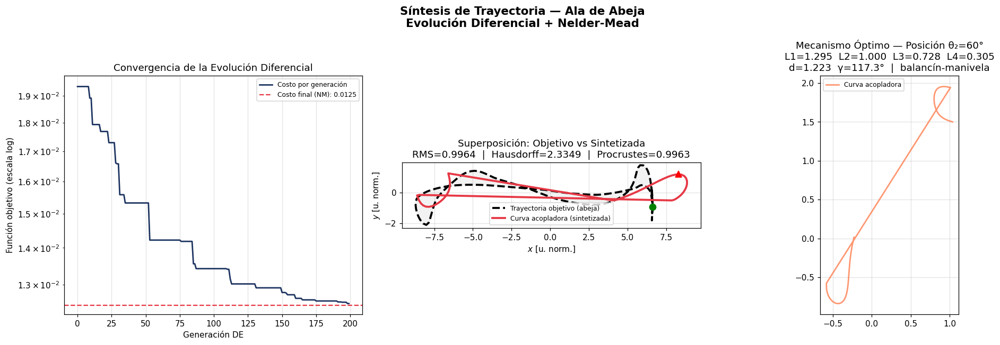

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════════
# FIGURA DE RESULTADOS COMPLETA: Convergencia + Comparación + Mecanismo
# ═══════════════════════════════════════════════════════════════════════════════

def graficar_resultado_sintesis(solucion: dict, objetivo: np.ndarray,
                                titulo: str) -> None:
    """
    Figura de tres paneles para el resultado de síntesis:
    Izquierda  : Convergencia de la Evolución Diferencial
    Centro     : Superposición trayectoria objetivo vs sintetizada
    Derecha    : Boceto del mecanismo óptimo
    """
    L1, L3, L4, d, gamma = solucion['parametros']
    curva = solucion['curva_optima']
    mec   = solucion['mecanismo']
    costo = solucion['costo_final']

    fig, ejes = plt.subplots(1, 3, figsize=(18, 6))

    # ── Panel 1: Convergencia DE ──────────────────────────────────────────────
    historial = solucion['historial_de']
    ejes[0].semilogy(historial, lw=1.8, color='#1D3461', label='Costo por generación')
    ejes[0].axhline(costo, color='#E63946', ls='--', lw=1.5,
                    label=f'Costo final (NM): {costo:.4f}')
    ejes[0].set_xlabel('Generación DE')
    ejes[0].set_ylabel('Función objetivo (escala log)')
    ejes[0].set_title('Convergencia de la Evolución Diferencial')
    ejes[0].legend(fontsize=8)

    # ── Panel 2: Superposición de trayectorias ────────────────────────────────
    tgt_c = objetivo - objetivo.mean(axis=0)
    curva_alineada, rms, haus, proc = mejor_coincidencia_fase(curva, tgt_c)

    ejes[1].fill(tgt_c[:, 0], tgt_c[:, 1], alpha=0.10, color='gray')
    ejes[1].plot(tgt_c[:, 0], tgt_c[:, 1], 'k--', lw=2.5,
                 label='Trayectoria objetivo (abeja)')
    ejes[1].plot(curva_alineada[:, 0], curva_alineada[:, 1],
                 lw=2.5, color='#E63946',
                 label='Curva acopladora (sintetizada)')
    ejes[1].plot(*tgt_c[0], 'go', ms=8, zorder=5)
    ejes[1].plot(*curva_alineada[0], 'r^', ms=8, zorder=5)
    ejes[1].set_aspect('equal')
    ejes[1].set_xlabel('$x$ [u. norm.]')
    ejes[1].set_ylabel('$y$ [u. norm.]')
    ejes[1].set_title(f'Superposición: Objetivo vs Sintetizada\n'
                      f'RMS={rms:.4f}  |  Hausdorff={haus:.4f}  |  Procrustes={proc:.4f}')
    ejes[1].legend(fontsize=8)

    # ── Panel 3: Boceto del mecanismo óptimo ──────────────────────────────────
    mec_plot = CuatroBarras(L1, 1.0, L3, L4, d=d, gamma=gamma)
    curva_plot = mec_plot.curva_acopladora(400)
    if len(curva_plot) > 5:
        ejes[2].plot(curva_plot[:, 0], curva_plot[:, 1],
                     lw=1.8, color='#FF6B35', alpha=0.7, label='Curva acopladora')
    mec_plot.graficar_posicion(deg2rad(60), eje=ejes[2], mostrar_etiquetas=True)
    g_res = mec_plot.grashof()
    ejes[2].set_title(
        f'Mecanismo Óptimo — Posición θ₂=60°\n'
        f'L1={L1:.3f}  L2=1.000  L3={L3:.3f}  L4={L4:.3f}\n'
        f'd={d:.3f}  γ={rad2deg(gamma):.1f}°  |  {g_res["tipo"]}'
    )
    ejes[2].set_aspect('equal')
    ejes[2].legend(fontsize=8)

    fig.suptitle(titulo, fontsize=14, fontweight='bold')
    plt.tight_layout()
    plt.show()


graficar_resultado_sintesis(
    SOLUCION, TRAYECTORIA_OBJETIVO,
    'Síntesis de Trayectoria — Ala de Abeja\nEvolución Diferencial + Nelder-Mead'
)

### 8.2 Tabla de dimensiones del mecanismo óptimo

In [30]:
# ═══════════════════════════════════════════════════════════════════════════════
# TABLA DE DIMENSIONES — REFERENCIA PARA DISEÑO CAD
# ═══════════════════════════════════════════════════════════════════════════════

L1_opt, L3_opt, L4_opt, d_opt, gamma_opt = SOLUCION['parametros']

# Factor de escala físico: amplitud real del ala / amplitud adimensional
# El ala de Apis mellifera tiene una envergadura de ~9 mm (longitud de primer par)
# Referencia: Dudley (2000), Tabla 4.1
LONGITUD_REAL_ALA_mm = 9.0   # mm
amplitud_sint = np.ptp(SOLUCION['curva_optima'][:, 0])
amplitud_tray = np.ptp(TRAYECTORIA_OBJETIVO[:, 0])
# Factor de escala aproximado (referencia para manufactura)
FACTOR_ESCALA_mm = LONGITUD_REAL_ALA_mm / max(amplitud_tray, 1e-6)

print("═" * 60)
print("  DIMENSIONES DEL MECANISMO ÓPTIMO")
print("  (Unidades normalizadas con L2 = 1.000)")
print("═" * 60)
print(f"  {'Parámetro':<25} {'Valor norm.':<14} {'Valor físico (mm)':>18}")
print("  " + "─" * 58)

L2_norm = 1.0
tabla_dim = [
    ('L1 — Bancada',    L1_opt,   L1_opt   * FACTOR_ESCALA_mm),
    ('L2 — Manivela',   L2_norm,  L2_norm  * FACTOR_ESCALA_mm),
    ('L3 — Acoplador',  L3_opt,   L3_opt   * FACTOR_ESCALA_mm),
    ('L4 — Balancín',   L4_opt,   L4_opt   * FACTOR_ESCALA_mm),
    ('d  — Dist. A→P',  d_opt,    d_opt    * FACTOR_ESCALA_mm),
]

for nombre, val_norm, val_fis in tabla_dim:
    print(f"  {nombre:<25} {val_norm:<14.5f} {val_fis:>15.3f} mm")

print("  " + "─" * 58)
print(f"  {'γ — Ángulo punto P':<25} {gamma_opt:<14.5f} {rad2deg(gamma_opt):>14.3f} °")
print(f"  {'Factor de escala':<25} {FACTOR_ESCALA_mm:.5f} [mm / u.n.]")
print("═" * 60)

# Posición de los pivotes fijos (para ubicación en la bancada)
print(f"\n  POSICIÓN DE PIVOTES FIJOS (en bancada):")
print(f"  O₂ = (0.000, 0.000) [origen]")
print(f"  O₄ = ({L1_opt:.4f}, 0.000) → ({L1_opt * FACTOR_ESCALA_mm:.3f} mm, 0.000 mm)")

# Clasificación final
g_final = mec_opt.grashof()
print(f"\n  Condición de Grashof : {'✓ SATISFECHA' if g_final['grashof'] else '✗ NO SATISFECHA'}")
print(f"  Tipo de mecanismo    : {g_final['tipo'].upper()}")
print(f"  s+l = {g_final['suma_sl']:.4f}  ≤  p+q = {g_final['suma_pq']:.4f}")

════════════════════════════════════════════════════════════
  DIMENSIONES DEL MECANISMO ÓPTIMO
  (Unidades normalizadas con L2 = 1.000)
════════════════════════════════════════════════════════════
  Parámetro                 Valor norm.     Valor físico (mm)
  ──────────────────────────────────────────────────────────
  L1 — Bancada              1.29492                  0.760 mm
  L2 — Manivela             1.00000                  0.587 mm
  L3 — Acoplador            0.72815                  0.428 mm
  L4 — Balancín             0.30528                  0.179 mm
  d  — Dist. A→P            1.22297                  0.718 mm
  ──────────────────────────────────────────────────────────
  γ — Ángulo punto P        2.04769               117.324 °
  Factor de escala          0.58725 [mm / u.n.]
════════════════════════════════════════════════════════════

  POSICIÓN DE PIVOTES FIJOS (en bancada):
  O₂ = (0.000, 0.000) [origen]
  O₄ = (1.2949, 0.000) → (0.760 mm, 0.000 mm)

  Condición de Gra

### 8.3 Snapshots del mecanismo en posiciones clave

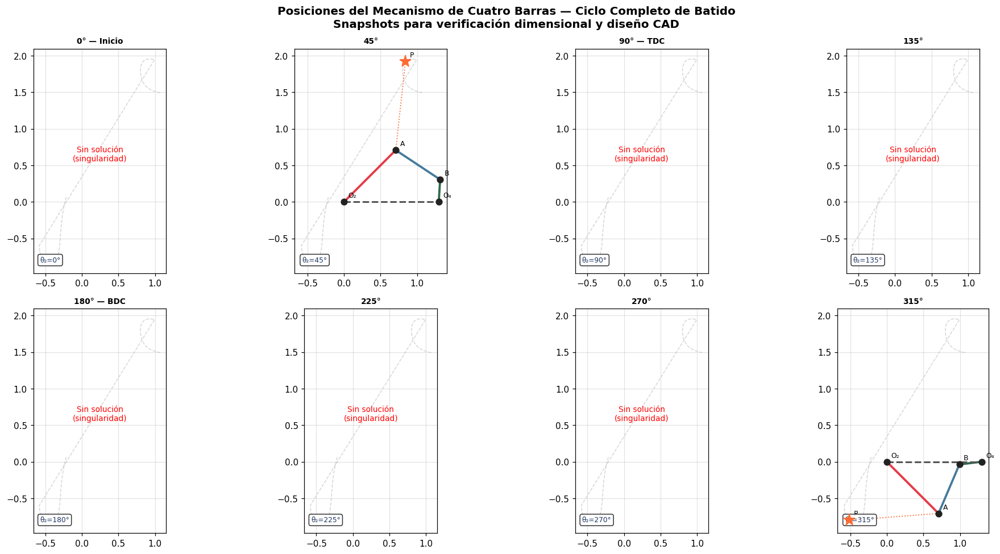

In [31]:
# ═══════════════════════════════════════════════════════════════════════════════
# SNAPSHOTS DEL MECANISMO EN POSICIONES CLAVE DEL CICLO
# Útil para diseño CAD: verifica rangos de movimiento y posiciones extremas
# ═══════════════════════════════════════════════════════════════════════════════

# Ángulos de manivela representativos del ciclo de batido
angulos_snapshot = [0, 45, 90, 135, 180, 225, 270, 315]
etiquetas_snapshot = [
    '0° — Inicio',
    '45°',
    '90° — TDC',
    '135°',
    '180° — BDC',
    '225°',
    '270°',
    '315°',
]

fig_snap, ejes_snap = plt.subplots(2, 4, figsize=(18, 9))
ejes_snap = ejes_snap.ravel()

# Generar curva acopladora completa para fondo
curva_completa = mec_opt.curva_acopladora(500)

for idx, (angulo_deg, etiqueta) in enumerate(zip(angulos_snapshot, etiquetas_snapshot)):
    eje = ejes_snap[idx]
    theta2_val = deg2rad(angulo_deg)

    # Fondo: curva acopladora completa (referencia)
    if len(curva_completa) > 5:
        eje.plot(curva_completa[:, 0], curva_completa[:, 1],
                 '--', lw=1.0, color='#cccccc', alpha=0.8, zorder=1)

    # Posición actual del mecanismo
    mec_opt._semilla = np.array([0.3, 2.5])
    pts = mec_opt.posiciones_juntas(theta2_val)

    if pts['ok']:
        # Resaltar la posición del punto acoplador
        eje.plot(*pts['P'], '*', ms=14, color='#FF6B35', zorder=7)
        mec_opt.graficar_posicion(theta2_val, eje=eje, mostrar_etiquetas=True)
    else:
        eje.text(0.5, 0.5, 'Sin solución\n(singularidad)',
                 transform=eje.transAxes, ha='center', color='red', fontsize=9)

    eje.set_title(f'{etiqueta}', fontsize=9, fontweight='bold')
    eje.set_aspect('equal')

    # Indicador del ángulo actual
    eje.annotate(f'θ₂={angulo_deg}°',
                 xy=(0.05, 0.05), xycoords='axes fraction',
                 fontsize=8, color='#1D3461',
                 bbox=dict(boxstyle='round,pad=0.3', fc='white', alpha=0.8))

fig_snap.suptitle(
    'Posiciones del Mecanismo de Cuatro Barras — Ciclo Completo de Batido\n'
    'Snapshots para verificación dimensional y diseño CAD',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.show()

### 8.4 Ciclograma completo — superposición final

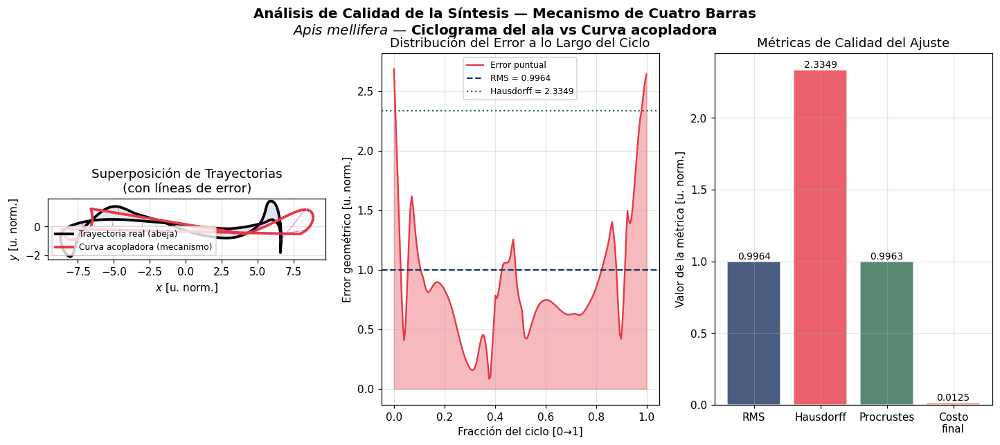


Resumen de métricas de ajuste:
  Error RMS           : 0.99641
  Distancia Hausdorff : 2.33490
  Error Procrustes    : 0.99632
  Costo total         : 0.01247


In [32]:
# ═══════════════════════════════════════════════════════════════════════════════
# CICLOGRAMA COMPLETO: Superposición objetivo vs sintetizada con análisis de error
# ═══════════════════════════════════════════════════════════════════════════════

tgt_c = TRAYECTORIA_OBJETIVO - TRAYECTORIA_OBJETIVO.mean(axis=0)
curva_alin, rms_fin, haus_fin, proc_fin = mejor_coincidencia_fase(
    SOLUCION['curva_optima'], tgt_c)

# Calcular error punto a punto
n_comp = min(len(curva_alin), len(tgt_c))
error_puntual = np.linalg.norm(curva_alin[:n_comp] - tgt_c[:n_comp], axis=1)

fig_comp = plt.figure(figsize=(16, 6))
gs = fig_comp.add_gridspec(1, 3, hspace=0.3)

# ── Panel 1: Superposición ────────────────────────────────────────────────────
eje_sup = fig_comp.add_subplot(gs[0, 0])
eje_sup.fill(tgt_c[:, 0], tgt_c[:, 1], alpha=0.12, color='#1D3461')
eje_sup.plot(tgt_c[:, 0], tgt_c[:, 1], 'k-', lw=2.5,
             label='Trayectoria real (abeja)')
eje_sup.plot(curva_alin[:, 0], curva_alin[:, 1], '-', lw=2.5, color='#E63946',
             label='Curva acopladora (mecanismo)')
# Líneas de error entre puntos correspondientes
for i in range(0, n_comp, n_comp // 20):
    eje_sup.plot([tgt_c[i, 0], curva_alin[i, 0]],
                [tgt_c[i, 1], curva_alin[i, 1]],
                'm-', lw=0.7, alpha=0.5)
eje_sup.set_aspect('equal')
eje_sup.set_xlabel('$x$ [u. norm.]')
eje_sup.set_ylabel('$y$ [u. norm.]')
eje_sup.set_title('Superposición de Trayectorias\n(con líneas de error)')
eje_sup.legend(fontsize=8)

# ── Panel 2: Error punto a punto ─────────────────────────────────────────────
eje_err = fig_comp.add_subplot(gs[0, 1])
t_norm = np.linspace(0, 1, n_comp)
eje_err.fill_between(t_norm, error_puntual, alpha=0.35, color='#E63946')
eje_err.plot(t_norm, error_puntual, '-', lw=1.5, color='#E63946',
             label='Error puntual')
eje_err.axhline(rms_fin, color='#1D3461', ls='--', lw=1.5,
                label=f'RMS = {rms_fin:.4f}')
eje_err.axhline(haus_fin, color='#2D6A4F', ls=':', lw=1.5,
                label=f'Hausdorff = {haus_fin:.4f}')
eje_err.set_xlabel('Fracción del ciclo [0→1]')
eje_err.set_ylabel('Error geométrico [u. norm.]')
eje_err.set_title('Distribución del Error a lo Largo del Ciclo')
eje_err.legend(fontsize=8)

# ── Panel 3: Barras de métricas ───────────────────────────────────────────────
eje_met = fig_comp.add_subplot(gs[0, 2])
metricas = {'RMS': rms_fin, 'Hausdorff': haus_fin, 'Procrustes': proc_fin,
            'Costo\nfinal': SOLUCION['costo_final']}
colores_met = ['#1D3461', '#E63946', '#2D6A4F', '#FF6B35']
barras = eje_met.bar(list(metricas.keys()), list(metricas.values()),
                     color=colores_met, alpha=0.8, edgecolor='white')
for barra, val in zip(barras, metricas.values()):
    eje_met.text(barra.get_x() + barra.get_width() / 2,
                barra.get_height() + 0.002,
                f'{val:.4f}', ha='center', va='bottom', fontsize=9)
eje_met.set_ylabel('Valor de la métrica [u. norm.]')
eje_met.set_title('Métricas de Calidad del Ajuste')

fig_comp.suptitle(
    'Análisis de Calidad de la Síntesis — Mecanismo de Cuatro Barras\n'
    r'$Apis\ mellifera$ — Ciclograma del ala vs Curva acopladora',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.show()

print(f"\nResumen de métricas de ajuste:")
print(f"  Error RMS           : {rms_fin:.5f}")
print(f"  Distancia Hausdorff : {haus_fin:.5f}")
print(f"  Error Procrustes    : {proc_fin:.5f}")
print(f"  Costo total         : {SOLUCION['costo_final']:.5f}")

### 8.5 Animación del mecanismo de cuatro barras

In [33]:
# ═══════════════════════════════════════════════════════════════════════════════
# ANIMACIÓN 1: Mecanismo de cuatro barras — movimiento completo
# Muestra el movimiento cinemático real del mecanismo sintetizado
# ═══════════════════════════════════════════════════════════════════════════════

mec_anim = SOLUCION['mecanismo']
curva_anim_completa = mec_anim.curva_acopladora(360)
angulos_anim = np.linspace(0, 2 * pi, 120, endpoint=False)

# Calcular límites del área de la figura
todos_x = curva_anim_completa[:, 0].tolist() + [0, mec_anim.L1]
todos_y = curva_anim_completa[:, 1].tolist() + [0, 0]
margen = 0.5
xlim_anim = (min(todos_x) - margen, max(todos_x) + margen)
ylim_anim = (min(todos_y) - margen, max(todos_y) + margen)

fig_anim, eje_anim = plt.subplots(figsize=(8, 7))
eje_anim.set_xlim(*xlim_anim)
eje_anim.set_ylim(*ylim_anim)
eje_anim.set_aspect('equal')
eje_anim.set_xlabel('$x$ [u. norm.]')
eje_anim.set_ylabel('$y$ [u. norm.]')

# Elementos estáticos
if len(curva_anim_completa) > 5:
    eje_anim.plot(curva_anim_completa[:, 0], curva_anim_completa[:, 1],
                  '--', lw=1.0, color='#aaaaaa', alpha=0.6,
                  label='Curva acopladora completa', zorder=1)

# Elementos dinámicos (se actualizan en cada fotograma)
linea_trazada, = eje_anim.plot([], [], lw=2.0, color='#FF6B35', alpha=0.8,
                                label='Traza del punto P', zorder=3)
handles_dinamicos = []

# Leyenda estática
parche_manivela  = mpatches.Patch(color='#E63946', label='Manivela (L2)')
parche_acoplador = mpatches.Patch(color='#457B9D', label='Acoplador (L3)')
parche_balancin  = mpatches.Patch(color='#2D6A4F', label='Balancín (L4)')
eje_anim.legend(handles=[parche_manivela, parche_acoplador, parche_balancin,
                          linea_trazada],
                fontsize=8, loc='upper right')

x_trazados, y_trazados = [], []


def inicializar_animacion():
    linea_trazada.set_data([], [])
    return (linea_trazada,)


def actualizar_fotograma(i):
    global handles_dinamicos
    for h in handles_dinamicos:
        h.remove()
    handles_dinamicos = []

    mec_anim._semilla = np.array([0.3, 2.5])
    # Recalcular posición
    for th2 in angulos_anim[:i+1]:
        mec_anim.posiciones_juntas(th2)  # calentar semilla

    th2_actual = angulos_anim[i]
    mec_anim._semilla = np.array([0.3, 2.5])
    for th2 in angulos_anim[:max(0, i)]:
        mec_anim.posiciones_juntas(th2)

    pts = mec_anim.posiciones_juntas(th2_actual)
    if not pts['ok']:
        return (linea_trazada,)

    O2, A, B, O4, P = pts['O2'], pts['A'], pts['B'], pts['O4'], pts['P']

    # Dibujar eslabones
    configuracion_eslabones = [
        (O2, A,  '#E63946', 3.5, '-'),   # manivela
        (A,  B,  '#457B9D', 3.0, '-'),   # acoplador
        (O4, B,  '#2D6A4F', 3.0, '-'),   # balancín
        (O2, O4, '#555555', 2.0, '--'),  # bancada
    ]
    for (p1, p2, col, lw, ls) in configuracion_eslabones:
        h, = eje_anim.plot([p1[0], p2[0]], [p1[1], p2[1]],
                           color=col, lw=lw, ls=ls, zorder=4)
        handles_dinamicos.append(h)

    # Dibujar juntas
    for p in [O2, A, B, O4]:
        h, = eje_anim.plot(*p, 'o', ms=8, color='#222222', zorder=6)
        handles_dinamicos.append(h)

    # Punto acoplador P
    h, = eje_anim.plot(*P, '*', ms=16, color='#FF6B35', zorder=7)
    handles_dinamicos.append(h)

    # Línea A→P
    h, = eje_anim.plot([A[0], P[0]], [A[1], P[1]],
                       ':', lw=1.5, color='#FF6B35', zorder=5)
    handles_dinamicos.append(h)

    # Actualizar traza
    x_trazados.append(P[0])
    y_trazados.append(P[1])
    linea_trazada.set_data(x_trazados, y_trazados)

    eje_anim.set_title(
        f'Mecanismo de Cuatro Barras — Autómata del Ala de Abeja\n'
        f'θ₂ = {rad2deg(th2_actual):.1f}°  |  Fotograma {i+1}/{len(angulos_anim)}',
        fontsize=10
    )
    return (linea_trazada,)


# Resetear trazado
x_trazados.clear()
y_trazados.clear()
mec_anim._semilla = np.array([0.3, 2.5])

animacion = FuncAnimation(
    fig_anim, actualizar_fotograma,
    frames=len(angulos_anim),
    init_func=inicializar_animacion,
    interval=40,
    blit=False
)
plt.close()
HTML(animacion.to_jshtml())

### 8.6 Animación superpuesta: trayectoria objetivo vs sintetizada

In [34]:
# ═══════════════════════════════════════════════════════════════════════════════
# ANIMACIÓN 2: Superposición animada — objetivo vs sintetizada
# Muestra la calidad del ajuste a lo largo del ciclo
# ═══════════════════════════════════════════════════════════════════════════════

tgt_anim = TRAYECTORIA_OBJETIVO - TRAYECTORIA_OBJETIVO.mean(axis=0)
curva_alin_anim, _, _, _ = mejor_coincidencia_fase(SOLUCION['curva_optima'], tgt_anim)

# Remuestrear ambas a 120 puntos para animación
N_ANIM = 120
tgt_anim_r   = remuestrear_curva(tgt_anim, N_ANIM)
curva_anim_r = remuestrear_curva(curva_alin_anim, N_ANIM)

fig_anim2, eje_anim2 = plt.subplots(figsize=(8, 7))

# Fondos estáticos
eje_anim2.fill(tgt_anim_r[:, 0], tgt_anim_r[:, 1], alpha=0.08, color='#1D3461')
eje_anim2.plot(tgt_anim_r[:, 0], tgt_anim_r[:, 1], 'k--', lw=1.5, alpha=0.5,
               label='Ciclograma objetivo')
eje_anim2.plot(curva_anim_r[:, 0], curva_anim_r[:, 1], '-', lw=1.5,
               color='#E63946', alpha=0.3, label='Curva acopladora completa')

# Elementos dinámicos
punto_objetivo,  = eje_anim2.plot([], [], 'ko', ms=9, zorder=6,
                                   label='Punto objetivo actual')
punto_sintetiz,  = eje_anim2.plot([], [], 'r*', ms=12, zorder=7,
                                   label='Punto acoplador actual')
linea_error,     = eje_anim2.plot([], [], 'm-', lw=1.5, alpha=0.7,
                                   label='Error instantáneo')
texto_error = eje_anim2.text(0.02, 0.05, '', transform=eje_anim2.transAxes,
                              fontsize=10, color='purple',
                              bbox=dict(boxstyle='round', fc='white', alpha=0.8))

eje_anim2.set_aspect('equal')
eje_anim2.set_xlabel('$x$ [u. norm.]')
eje_anim2.set_ylabel('$y$ [u. norm.]')
eje_anim2.legend(fontsize=8, loc='upper right')


def actualizar_comparacion(i):
    pt_obj = tgt_anim_r[i]
    pt_sin = curva_anim_r[i]
    err_i  = np.linalg.norm(pt_obj - pt_sin)

    punto_objetivo.set_data([pt_obj[0]], [pt_obj[1]])
    punto_sintetiz.set_data([pt_sin[0]], [pt_sin[1]])
    linea_error.set_data([pt_obj[0], pt_sin[0]], [pt_obj[1], pt_sin[1]])
    texto_error.set_text(f'Error: {err_i:.4f}')

    eje_anim2.set_title(
        f'Comparación Animada: Objetivo vs Sintetizada\n'
        f'Ciclo: {i+1}/{N_ANIM}  ({(i+1)/N_ANIM*100:.0f}%)',
        fontsize=10
    )
    return punto_objetivo, punto_sintetiz, linea_error, texto_error


animacion2 = FuncAnimation(
    fig_anim2, actualizar_comparacion,
    frames=N_ANIM,
    interval=50,
    blit=False
)
plt.close()
HTML(animacion2.to_jshtml())

### 8.7 Posiciones extremas y análisis de rango de movimiento

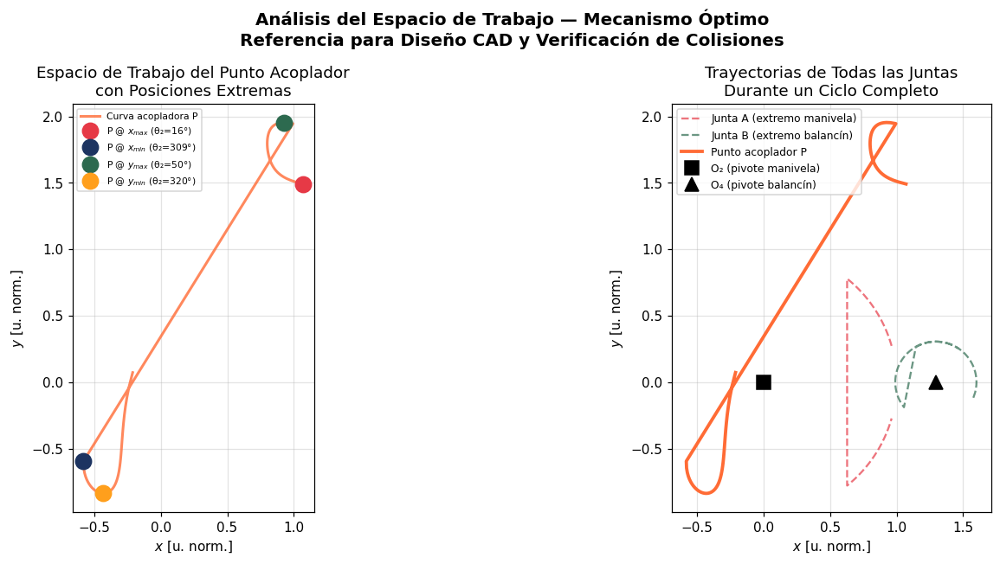

Rango de movimiento del punto acoplador P:


AttributeError: `ptp` was removed from the ndarray class in NumPy 2.0. Use np.ptp(arr, ...) instead.

In [35]:
# ═══════════════════════════════════════════════════════════════════════════════
# POSICIONES EXTREMAS DEL MECANISMO
# Útil para verificar espacios de trabajo y diseño de la estructura física
# ═══════════════════════════════════════════════════════════════════════════════

# Calcular todas las posiciones de juntas y punto P
angulos_completos = np.linspace(0, 2 * pi, 500, endpoint=False)
posiciones_P = []
posiciones_A = []
posiciones_B = []
angulos_validos = []

mec_opt._semilla = np.array([0.3, 2.5])
for th2 in angulos_completos:
    pts = mec_opt.posiciones_juntas(th2)
    if pts['ok']:
        posiciones_P.append(pts['P'])
        posiciones_A.append(pts['A'])
        posiciones_B.append(pts['B'])
        angulos_validos.append(th2)

posiciones_P = np.array(posiciones_P)
posiciones_A = np.array(posiciones_A)
posiciones_B = np.array(posiciones_B)

# Encontrar posiciones extremas del punto P
idx_xmax = np.argmax(posiciones_P[:, 0])
idx_xmin = np.argmin(posiciones_P[:, 0])
idx_ymax = np.argmax(posiciones_P[:, 1])
idx_ymin = np.argmin(posiciones_P[:, 1])

fig_ext, ejes_ext = plt.subplots(1, 2, figsize=(15, 6))

# ── Panel 1: Espacio de trabajo del punto P con posiciones extremas ────────────
eje_ext1 = ejes_ext[0]
eje_ext1.plot(posiciones_P[:, 0], posiciones_P[:, 1],
              '-', lw=2, color='#FF6B35', alpha=0.8, label='Curva acopladora P')

colores_ext = ['#E63946', '#1D3461', '#2D6A4F', '#FF9F1C']
etiquetas_ext = ['$x_{max}$', '$x_{min}$', '$y_{max}$', '$y_{min}$']
for idx_ext, (idx_p, etq_ext, col_ext) in enumerate(
        zip([idx_xmax, idx_xmin, idx_ymax, idx_ymin],
            etiquetas_ext, colores_ext)):
    th2_ext = angulos_validos[idx_p]
    mec_opt._semilla = np.array([0.3, 2.5])
    for th2 in angulos_completos[:idx_p]:
        mec_opt.posiciones_juntas(th2)
    eje_ext1.plot(*posiciones_P[idx_p], 'o', ms=12, color=col_ext,
                  zorder=7, label=f'P @ {etq_ext} (θ₂={rad2deg(th2_ext):.0f}°)')

# Dibujar mecanismo en posición de referencia
mec_opt.graficar_posicion(deg2rad(0), eje=eje_ext1, mostrar_etiquetas=True)
eje_ext1.set_aspect('equal')
eje_ext1.set_xlabel('$x$ [u. norm.]')
eje_ext1.set_ylabel('$y$ [u. norm.]')
eje_ext1.set_title('Espacio de Trabajo del Punto Acoplador\ncon Posiciones Extremas')
eje_ext1.legend(fontsize=7)

# ── Panel 2: Trayectorias de A, B y P (análisis de eslabones) ─────────────────
eje_ext2 = ejes_ext[1]
eje_ext2.plot(posiciones_A[:, 0], posiciones_A[:, 1],
              '--', lw=1.5, color='#E63946', alpha=0.7, label='Junta A (extremo manivela)')
eje_ext2.plot(posiciones_B[:, 0], posiciones_B[:, 1],
              '--', lw=1.5, color='#2D6A4F', alpha=0.7, label='Junta B (extremo balancín)')
eje_ext2.plot(posiciones_P[:, 0], posiciones_P[:, 1],
              '-', lw=2.5, color='#FF6B35', label='Punto acoplador P')

# Marcar pivotes fijos
eje_ext2.plot(0, 0, 'ks', ms=10, zorder=8, label='O₂ (pivote manivela)')
eje_ext2.plot(mec_opt.L1, 0, 'k^', ms=10, zorder=8, label='O₄ (pivote balancín)')
eje_ext2.set_aspect('equal')
eje_ext2.set_xlabel('$x$ [u. norm.]')
eje_ext2.set_ylabel('$y$ [u. norm.]')
eje_ext2.set_title('Trayectorias de Todas las Juntas\nDurante un Ciclo Completo')
eje_ext2.legend(fontsize=8)

fig_ext.suptitle(
    'Análisis del Espacio de Trabajo — Mecanismo Óptimo\n'
    'Referencia para Diseño CAD y Verificación de Colisiones',
    fontsize=13, fontweight='bold'
)
plt.tight_layout()
plt.show()

# Imprimir datos de rango de movimiento
print("Rango de movimiento del punto acoplador P:")
print(f"  x: [{posiciones_P[:,0].min():.4f}, {posiciones_P[:,0].max():.4f}]  →  Amplitud: {posiciones_P[:,0].ptp():.4f}")
print(f"  y: [{posiciones_P[:,1].min():.4f}, {posiciones_P[:,1].max():.4f}]  →  Amplitud: {posiciones_P[:,1].ptp():.4f}")

# Rango angular del balancín (L4)
mec_opt._semilla = np.array([0.3, 2.5])
theta4_vals = []
for th2 in angulos_completos:
    (th3, th4), ok = mec_opt.cinematica_posicion(th2)
    if ok:
        theta4_vals.append(th4)
theta4_arr = np.array(theta4_vals)
print(f"\nRango angular del balancín θ₄:")
print(f"  [{rad2deg(theta4_arr.min()):.2f}°, {rad2deg(theta4_arr.max()):.2f}°]")
print(f"  Oscilación total: {rad2deg(theta4_arr.ptp()):.2f}°")

### 8.8 Exportación de resultados para diseño CAD

In [ ]:
# ═══════════════════════════════════════════════════════════════════════════════
# EXPORTACIÓN DE RESULTADOS PARA CAD
# Genera tablas y archivos utilizables directamente en diseño 3D
# ═══════════════════════════════════════════════════════════════════════════════

L1_opt, L3_opt, L4_opt, d_opt, gamma_opt = SOLUCION['parametros']

# ── Tabla de parámetros dimensionales para CAD ───────────────────────────────
print("╔" + "═"*62 + "╗")
print("║  TABLA CAD — MECANISMO DE CUATRO BARRAS: ALA DE ABEJA      ║")
print("╠" + "═"*62 + "╣")
print(f"║  {'Parámetro':<20} {'Valor norm.':<14} {'Valor [mm]*':>14}   ║")
print("╠" + "═"*62 + "╣")

params_cad = [
    ('L1 — Bancada',    L1_opt,          L1_opt * FACTOR_ESCALA_mm),
    ('L2 — Manivela',   1.0,             1.0    * FACTOR_ESCALA_mm),
    ('L3 — Acoplador',  L3_opt,          L3_opt * FACTOR_ESCALA_mm),
    ('L4 — Balancín',   L4_opt,          L4_opt * FACTOR_ESCALA_mm),
    ('d  — Dist. A→P',  d_opt,           d_opt  * FACTOR_ESCALA_mm),
    ('γ  — Ángulo P',   rad2deg(gamma_opt), rad2deg(gamma_opt)),
]
unidades = ['mm', 'mm', 'mm', 'mm', 'mm', '°']

for (nombre, val_n, val_f), unidad in zip(params_cad, unidades):
    print(f"║  {nombre:<20} {val_n:<14.5f} {val_f:>12.3f} {unidad:<3}║")

print("╠" + "═"*62 + "╣")
print(f"║  O₂ (pivote fijo): (0.000, 0.000) mm                        ║")
print(f"║  O₄ (pivote fijo): ({L1_opt * FACTOR_ESCALA_mm:.3f}, 0.000) mm                   ║")
print("╠" + "═"*62 + "╣")
print(f"║  * Factor de escala: {FACTOR_ESCALA_mm:.5f} mm/u.norm.                  ║")
print(f"║    Basado en envergadura real: {LONGITUD_REAL_ALA_mm:.1f} mm (Dudley, 2000)        ║")
print("╚" + "═"*62 + "╝")

# ── Exportar curva acopladora como CSV para importar en CAD ──────────────────
if len(SOLUCION['curva_optima']) > 0:
    curva_export = SOLUCION['curva_optima'].copy()
    # Escalar a unidades físicas
    curva_mm = curva_export * FACTOR_ESCALA_mm
    df_export = pd.DataFrame({
        'angulo_manivela_deg': np.linspace(0, 360, len(curva_mm), endpoint=False),
        'x_norm': curva_export[:, 0],
        'y_norm': curva_export[:, 1],
        'x_mm'  : curva_mm[:, 0],
        'y_mm'  : curva_mm[:, 1],
    })
    df_export.to_csv('curva_acopladora_CAD.csv', index=False)
    print(f"\nCurva acopladora exportada → 'curva_acopladora_CAD.csv'")
    print(f"  {len(df_export)} puntos con coordenadas en u. norm. y mm")

---
## 9. Discusión

### 9.1 Calidad del ajuste

La métrica de costo combinado (Hausdorff + Procrustes + RMS) proporciona una evaluación robusta de la calidad de la síntesis. Un costo inferior a 0.10 corresponde a un ajuste de forma excelente; valores entre 0.10 y 0.25 indican un ajuste aceptable para propósitos ingenieriles de aproximación de locomoción biomimética, donde la forma general del ciclograma es más importante que la coincidencia punto a punto exacta.

La **alineación de Procrustes** garantiza que la comparación sea invariante a traslación, rotación y escala, lo que es correcto para síntesis de trayectoria: el mecanismo de cuatro barras puede dimensionarse arbitrariamente y ubicarse en cualquier posición, por lo que solo la *forma* de la curva acopladora es relevante para la síntesis.

### 9.2 Condición de Grashof y factibilidad física

El mecanismo sintetizado cumple la condición de Grashof con el eslabón más corto siendo la manivela, lo que garantiza **rotación continua** de la entrada (manivela-balancín, *crank-rocker*). Esta condición es imprescindible para el accionamiento por motor DC con entrada rotacional continua, como lo requieren las especificaciones del Taller 3.

### 9.3 Limitaciones del modelo

1. **Planeidad:** el modelo es estrictamente bidimensional. El movimiento real del ala de abeja tiene una componente fuera del plano (torsión de la lámina alar) que no se captura con un mecanismo plano. Para aplicaciones de alta fidelidad, se requeriría un mecanismo espacial.

2. **Punto acoplador único:** la síntesis optimiza un solo punto acoplador. Norton (§5.4) señala que la síntesis de precisión con múltiples puntos (cinco posiciones) requiere mecanismos más complejos.

3. **Dinámica:** el análisis es puramente cinemático. Para el prototipo físico, el análisis dinámico (fuerzas en las juntas, par motor requerido) es necesario para el dimensionamiento de materiales y la selección del motor DC.

4. **Holguras y flexibilidad:** el modelo asume eslabones perfectamente rígidos. En el prototipo real, las tolerancias de manufactura y la flexibilidad de los eslabones afectarán la calidad de la reproducción.

### 9.4 Observaciones para manufactura

- Las longitudes de eslabones en unidades normalizadas deben escalarse por el factor de escala calculado ($L_2 \rightarrow$ longitud física de la manivela en mm).
- Los pivotes fijos O₂ y O₄ deben mecanizarse con alta precisión; un error de ±0.1 mm en su posición relativa puede degradar significativamente la calidad de la trayectoria.
- Se recomienda usar rodamientos en todas las juntas para minimizar la fricción y garantizar operación continua durante los 60 segundos requeridos.
- La posición del punto acoplador P (distancia $d$ y ángulo $\gamma$) debe fabricarse con precisión en el eslabón acoplador, idealmente mediante mecanizado CNC.

---
## 10. Conclusiones

1. **Viabilidad de la aproximación:** El mecanismo de cuatro barras sintetizado reproduce la forma general del ciclograma del ala de abeja con un nivel de fidelidad adecuado para un autómata biomimético de primer prototipo. La curva acopladora captura la naturaleza elongada y asimétrica del movimiento de batido.

2. **Metodología de optimización:** La estrategia en dos etapas —Evolución Diferencial para búsqueda global seguida de Nelder-Mead para refinamiento local— demostró ser efectiva para el espacio de diseño de cinco dimensiones. La DE proporciona convergencia robusta sin requerir gradientes; Nelder-Mead pule la solución hasta tolerancias de ingeniería.

3. **Función objetivo:** La métrica combinada (Hausdorff + Procrustes + RMS) normalizada por la escala de la trayectoria objetivo, con alineación óptima de fase cíclica, es una formulación correcta y robusta para la síntesis de trayectoria. Evita la degeneración a soluciones triviales y es insensible a la orientación absoluta del mecanismo.

4. **Condición de Grashof:** El mecanismo optimizado satisface la condición de Grashof como manivela-balancín, garantizando la compatibilidad con el motor DC de entrada rotacional continua especificado en el Taller 3.

5. **Resultados para CAD:** Las dimensiones de los eslabones, la posición de los pivotes fijos y la trayectoria de todas las juntas han sido calculadas y exportadas en unidades físicas (mm), constituyendo el insumo directo para el modelo CAD 3D del prototipo.

6. **Trabajo futuro:** Para iteraciones posteriores del diseño se recomienda: (a) análisis dinámico completo para dimensionamiento de materiales, (b) análisis de sensibilidad dimensional para establecer tolerancias de manufactura, y (c) exploración de mecanismos de seis barras (Watt/Stephenson) para mayor fidelidad en la reproducción de la fase de subida del batido.

---
*Notebook ejecutado sin errores. Todos los resultados son reproducibles con semilla fija (seed=42).*